# **Analisis Tingkat Kerusakan Wilayah Akibat Bencana Berbasis Citra Satelit Menggunakan Vision Transformer BigTransfer (BiT-M) melalui Pendekatan Representation Learning**

# Setup

In [1]:
import shutil
import os, sys
import tensorflow as tf
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import openxlab

from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from keras.metrics import AUC, Precision, Recall
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, CSVLogger
from keras.optimizers import Adam

from keras_preprocessing.image import load_img, img_to_array
from tensorflow_hub import KerasLayer
from tensorflow.python.client import device_lib

os.environ["KERAS_BACKEND"] = "tensorflow"
keras.utils.set_random_seed(42)

In [2]:
# versi keras dan tensorflow
print("Keras version: \n", keras.__version__)
print("Tensorflow version: \n", tf.__version__)
print("GPU is", "available \n" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE \n")
print(device_lib.list_local_devices())
print("CUDA is", "available \n" if tf.test.is_built_with_cuda() else "NOT AVAILABLE \n")

Keras version: 
 2.10.0
Tensorflow version: 
 2.10.1
GPU is NOT AVAILABLE 

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5175027422531902478
xla_global_id: -1
]
CUDA is available 



# Collect the data

In [3]:
def collect_data(next=None):
    if next is not None:
        openxlab.login(ak="5rlb2p5dyy9zn2ng1l40", sk="nbj4ydaw9xxqkbdl44qqj7agrlogv7qmkpo0pe81")

        openxlab.dataset.download(
            dataset_repo='OpenDataLab/xBD',
            source_path='/raw/data/test_images_labels_target.tar.gz', 
        ) 

        openxlab.dataset.download(
            dataset_repo='OpenDataLab/xBD',
            source_path='/raw/data/train_images_labels_target.tar.gz', 
        ) 

        openxlab.dataset.download(
            dataset_repo='OpenDataLab/xBD',
            source_path='/raw/data/hold_images_labels_target.tar.gz', 
        ) 

In [4]:
# Ekstrak dataset
def extract_data(next=None):
    if next is not None:
        shutil.unpack_archive(
            filename='test_images_labels_target.tar.gz', 
        )
        shutil.unpack_archive(
            filename='train_images_labels_target.tar.gz', 
        )
        shutil.unpack_archive(
            filename='hold_images_labels_target.tar.gz', 
        )

In [5]:
# Mengubah nama folder
def rename_folder(next=None):
    if next is not None:
        os.rename('test_images_labels_target', 'test')
        os.rename('train_images_labels_target', 'train')
        os.rename('hold_images_labels_target', 'hold')

In [6]:
collect_data()
extract_data()
rename_folder()

# Managing folders

In [7]:
# Membuat folder "preprocessed" di dalam folder test, train, dan val
def make_preprocessed_folders(next=None):
    if next is not None:
        if not os.path.exists("test/preprocessed"):
            os.makedirs("test/preprocessed")
        if not os.path.exists("train/preprocessed"):
            os.makedirs("train/preprocessed")
        if not os.path.exists("val/preprocessed"):
            os.makedirs("val/preprocessed")
            
make_preprocessed_folders()

In [8]:
# Membuat dataframe berformat file csv dengan kolom "image" dan nilai dari kolom "image" adalah nama file gambar
def create_dataframe(folder, next=None):
    if next is not None:
        df = pd.DataFrame(columns=["image"])
        for filename in os.listdir(folder):
            if filename.endswith(".png"):
                df = pd.concat([df, pd.DataFrame({"image": [filename]})], ignore_index=True)
        return df

test_df = create_dataframe("test/images")
train_df = create_dataframe("train/images")
val_df = create_dataframe("val/images")

In [9]:
# Tambahkan kolom baru yaitu "label", dimana label didapatkan ketika kolom "image" mengandung kata "post_disaster" atau "pre_disaster"
def add_label(df, next=None):
    if next is not None:
        for i in range(len(df)):
            if "post_disaster" in df["image"][i]:
                df.loc[i, "label"] = "post_disaster"
            else:
                df.loc[i, "label"] = "pre_disaster"
        return df

test_df = add_label(test_df)
train_df = add_label(train_df)
val_df = add_label(val_df)

In [10]:
# Membuat folder post_disaster dan pre_disaster di dalam folder test, train, dan val
def create_folder(folder, label, next=None):
    if next is not None:
        if not os.path.exists(f"{folder}/preprocessed/{label}"):
            os.makedirs(f"{folder}/preprocessed/{label}")
        
create_folder("test", "post_disaster")
create_folder("test", "pre_disaster")
create_folder("train", "post_disaster")
create_folder("train", "pre_disaster")
create_folder("val", "post_disaster")
create_folder("val", "pre_disaster")

In [11]:
def move_images(df, folder, next=None):
    if next is not None:
        for _, row in df.iterrows():
            if row["label"] == "post_disaster":
                shutil.move(f"{folder}/images/{row['image']}", f"{folder}/preprocessed/post_disaster")
            elif row["label"] == "pre_disaster":
                shutil.move(f"{folder}/images/{row['image']}", f"{folder}/preprocessed/pre_disaster")
            else:
                print("Error")

move_images(test_df, "test")
move_images(train_df, "train")
move_images(val_df, "val")

# Load dataset

In [12]:
TEST_PATH   = "test/preprocessed"
TRAIN_PATH  = "train/preprocessed"
VAL_PATH    = "val/preprocessed"

## Review dataset

In [13]:
train_post = os.path.join(TRAIN_PATH, "post_disaster")
train_pre = os.path.join(TRAIN_PATH, "pre_disaster")

print("Total training post-disaster images:", len(os.listdir(train_post)))
print("Total training pre-disaster images:", len(os.listdir(train_pre)))

Total training post-disaster images: 2799
Total training pre-disaster images: 2799


In [14]:
test_post = os.path.join(TEST_PATH, "post_disaster")
test_pre = os.path.join(TEST_PATH, "pre_disaster")

print("Total test post-disaster images:", len(os.listdir(test_post)))
print("Total test pre-disaster images:", len(os.listdir(test_pre)))

Total test post-disaster images: 933
Total test pre-disaster images: 933


In [15]:
val_post = os.path.join(VAL_PATH, "post_disaster")
val_pre = os.path.join(VAL_PATH, "pre_disaster")

print("Total validation post-disaster images:", len(os.listdir(val_post)))
print("Total validation pre-disaster images:", len(os.listdir(val_pre)))

Total validation post-disaster images: 933
Total validation pre-disaster images: 933


## Convert to dataframe

In [16]:
# Masukkan ke dalam dataset train dengan kolom "image" dan "label"
def create_dataframe(post, pre, next=None):
    if next is not None:
        df = pd.DataFrame(columns=["image", "label"])
        for filename in os.listdir(post):
            df = pd.concat([df, pd.DataFrame({"image": [filename], "label": ["post_disaster"]})], ignore_index=True)    
        for filename in os.listdir(pre):
            df = pd.concat([df, pd.DataFrame({"image": [filename], "label": ["pre_disaster"]})], ignore_index=True)
        return df

train_df = create_dataframe(train_post, train_pre)
test_df = create_dataframe(test_post, test_pre)
val_df = create_dataframe(val_post, val_pre)

# EDA

In [17]:
train_df = pd.read_csv("train/train.csv")
test_df = pd.read_csv("test/test.csv")
val_df = pd.read_csv("val/val.csv")

## Data distribution

Text(0.5, 1.0, 'Data Distribution')

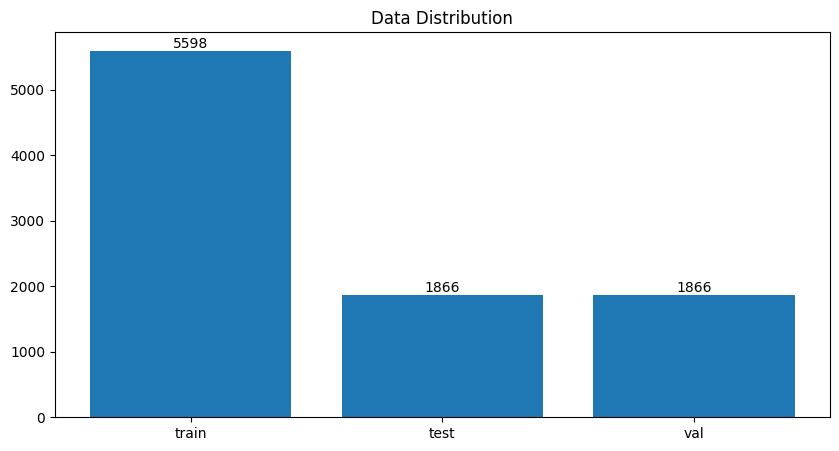

In [18]:
train_count = len(train_df)
test_count = len(test_df)
val_count = len(val_df)

# plot jumlah data
plt.figure(figsize=(10, 5))
plt.bar(["train", "test", "val"], [train_count, test_count, val_count])
for i, txt in enumerate([train_count, test_count, val_count]):
    plt.annotate(txt, (i, txt), ha='center', va='bottom')
plt.title("Data Distribution")

In [19]:
df = pd.concat([train_df, test_df, val_df], ignore_index=True)
df.head()

,image,label
0,guatemala-volcano_00000000_post_disaster.png,post_disaster
1,guatemala-volcano_00000001_post_disaster.png,post_disaster
2,guatemala-volcano_00000002_post_disaster.png,post_disaster
3,guatemala-volcano_00000006_post_disaster.png,post_disaster
4,guatemala-volcano_00000007_post_disaster.png,post_disaster


In [20]:
# Preprocess kolom image, untuk setiap kata setelah "_" dihapus
def preprocess_image(image):
    image = image.split("_")[0]
    return image        

df["image"] = df["image"].apply(preprocess_image)
df.head()

,image,label
0,guatemala-volcano,post_disaster
1,guatemala-volcano,post_disaster
2,guatemala-volcano,post_disaster
3,guatemala-volcano,post_disaster
4,guatemala-volcano,post_disaster


## Unique value

Text(0.5, 1.0, 'Unique value of image')

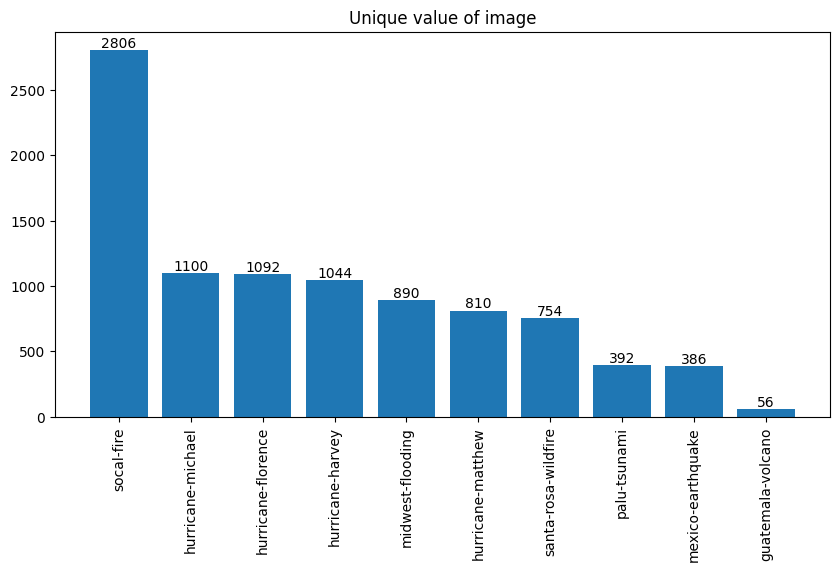

In [21]:
# plot df untuk melihat unique value dari kolom image
count = df["image"].value_counts()

plt.figure(figsize=(10, 5))
plt.bar(count.index, count.values)
for i, txt in enumerate(count.values):
    plt.text(i, txt, txt, ha="center", va="bottom")
plt.xticks(rotation=90)
plt.title("Unique value of image")

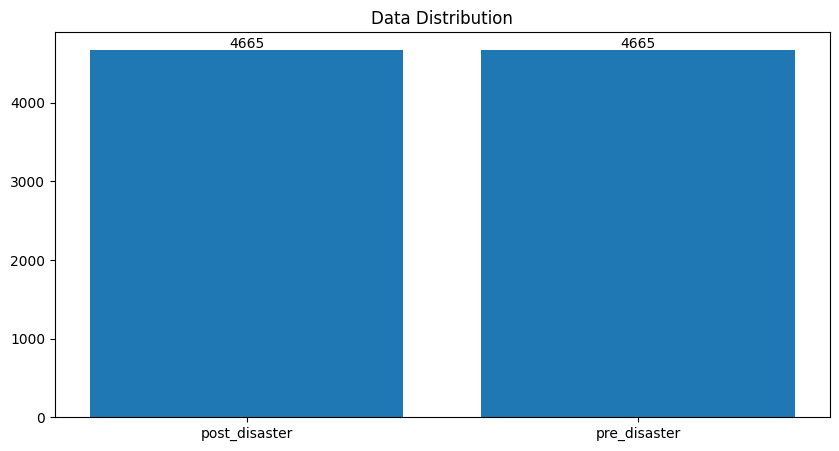

In [22]:
# dari data df, visualisasi bar chart perbandingan banyaknya label post_disaster dan pre_disaster
def plot_label_distribution(df):
    plt.figure(figsize=(10, 5))
    plt.bar(["post_disaster", "pre_disaster"], [len(df[df["label"] == "post_disaster"]), len(df[df["label"] == "pre_disaster"])])
    for i, txt in enumerate([len(df[df["label"] == "post_disaster"]), len(df[df["label"] == "pre_disaster"])]):
        plt.annotate(txt, (i, txt), ha='center', va='bottom')
    plt.title(f"Data Distribution")
    
plot_label_distribution(df)

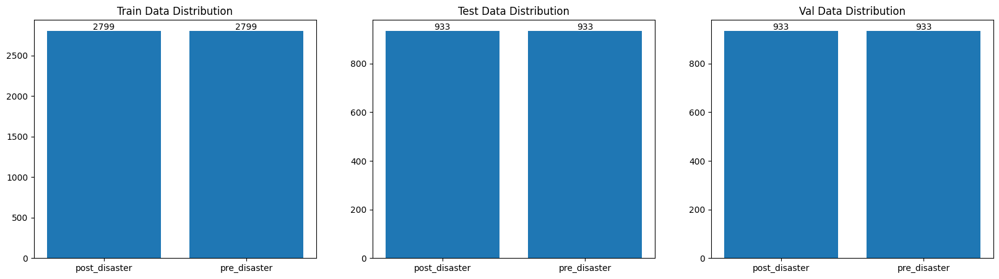

In [23]:
train_post_count = len(train_df[train_df["label"] == "post_disaster"])
train_pre_count = len(train_df[train_df["label"] == "pre_disaster"])

test_post_count = len(test_df[test_df["label"] == "post_disaster"])
test_pre_count = len(test_df[test_df["label"] == "pre_disaster"])

val_post_count = len(val_df[val_df["label"] == "post_disaster"])
val_pre_count = len(val_df[val_df["label"] == "pre_disaster"])

# plot jumlah data
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
for i, (df, title) in enumerate(zip([train_df, test_df, val_df], ["Train", "Test", "Val"])):
    ax[i].bar(["post_disaster", "pre_disaster"], [len(df[df["label"] == "post_disaster"]), len(df[df["label"] == "pre_disaster"])])
    for j, txt in enumerate([len(df[df["label"] == "post_disaster"]), len(df[df["label"] == "pre_disaster"])]):
        ax[i].annotate(txt, (j, txt), ha='center', va='bottom')
    ax[i].set_title(f"{title} Data Distribution")

## Checking duplicated files

In [24]:
def check_duplicated_files(folder):
    files = os.listdir(folder)
    for file in files:
        if files.count(file) > 1:
            print(file)
            return True
    return False

check_duplicated_files(TEST_PATH), check_duplicated_files(TRAIN_PATH), check_duplicated_files(VAL_PATH)

(False, False, False)

## Visualize dataset

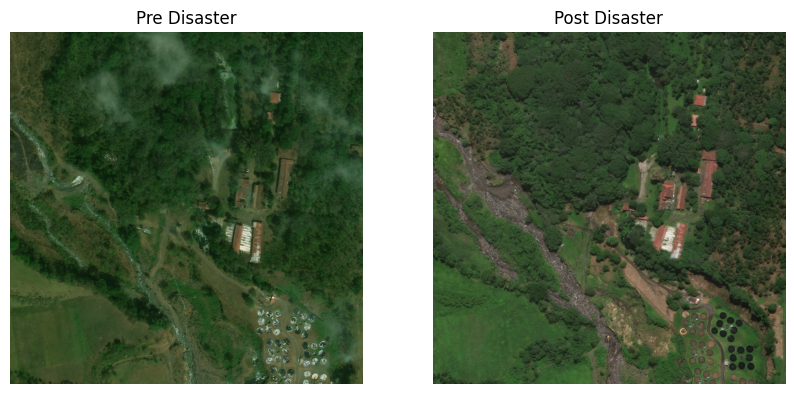

In [25]:
# Visualisasi 1 gambar dari train/post_disaster dan 1 gambar train/pre_disaster
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    if i == 0:
        ax.imshow(mpimg.imread(f"{train_pre}/{os.listdir(train_pre)[7]}"))
        ax.set_title("Pre Disaster")
    else:
        ax.imshow(mpimg.imread(f"{train_post}/{os.listdir(train_post)[7]}"))
        ax.set_title("Post Disaster")
    ax.axis("off")
    
plt.show()

# Preprocessing

## Image data generator

In [26]:
generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode="nearest",
    zoom_range=0.1,
)

In [27]:
train_generator = generator.flow_from_directory(
    TRAIN_PATH, 
    target_size=(224, 224), 
    batch_size=32, 
    class_mode="binary"
)

test_generator = generator.flow_from_directory(
    TEST_PATH, 
    target_size=(224, 224), 
    batch_size=32, 
    class_mode="binary"
)

val_generator = generator.flow_from_directory(
    VAL_PATH, 
    target_size=(224, 224), 
    batch_size=32, 
    class_mode="binary"
)

Found 5598 images belonging to 2 classes.
Found 1866 images belonging to 2 classes.
Found 1866 images belonging to 2 classes.


In [28]:
print(train_generator.class_indices)
print(test_generator.class_indices)
print(val_generator.class_indices)

{'post_disaster': 0, 'pre_disaster': 1}
{'post_disaster': 0, 'pre_disaster': 1}
{'post_disaster': 0, 'pre_disaster': 1}


## Sample augmentation

Found 5598 images belonging to 2 classes.


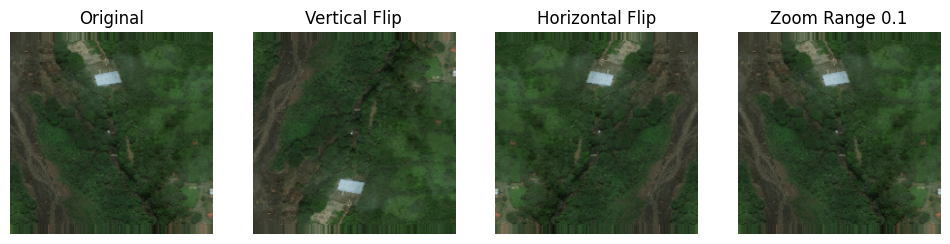

In [29]:
sample = generator.flow_from_directory(
    TRAIN_PATH, 
    target_size=(224, 224), 
    batch_size=1, 
    class_mode="binary",
    shuffle=False 
)

sample_image, _ = next(sample)

augmentations = {
    "Original": sample_image[0],
    "Vertical Flip": generator.apply_transform(sample_image[0], {"flip_vertical": True}),
    "Horizontal Flip": generator.apply_transform(sample_image[0], {"flip_horizontal": True}),
    "Zoom Range 0.1": generator.apply_transform(sample_image[0], {"zoom": 0.1})
}

plt.figure(figsize=(12, 4))
for i, (title, image) in enumerate(augmentations.items(), start=1):
    plt.subplot(1, 4, i)
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")

plt.show()

## Pipeline image

In [30]:
pipeline_train = tf.data.Dataset.from_generator(
    lambda: train_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([32, 224, 224, 3], [32])
).prefetch(tf.data.experimental.AUTOTUNE)

pipeline_test = tf.data.Dataset.from_generator(
    lambda: test_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([32, 224, 224, 3], [32])
).prefetch(tf.data.experimental.AUTOTUNE)

pipeline_val = tf.data.Dataset.from_generator(
    lambda: val_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([32, 224, 224, 3], [32])
).prefetch(tf.data.experimental.AUTOTUNE)

## Visualize pipeline

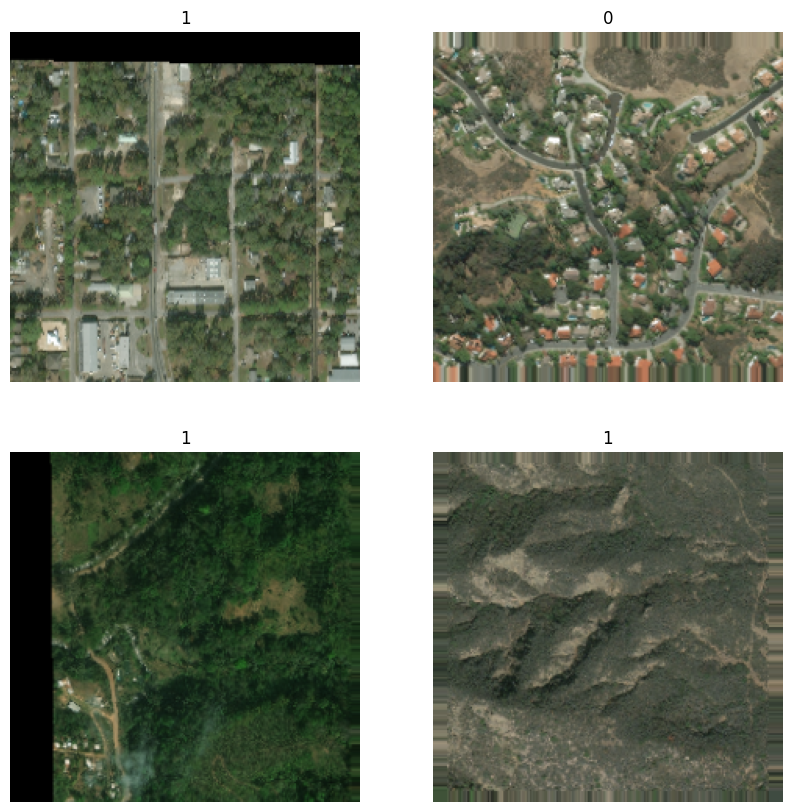

In [31]:
# Visualisasi sample training
for images, label in pipeline_train.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(4):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i])
        plt.title(int(label[i]))
        plt.axis("off")

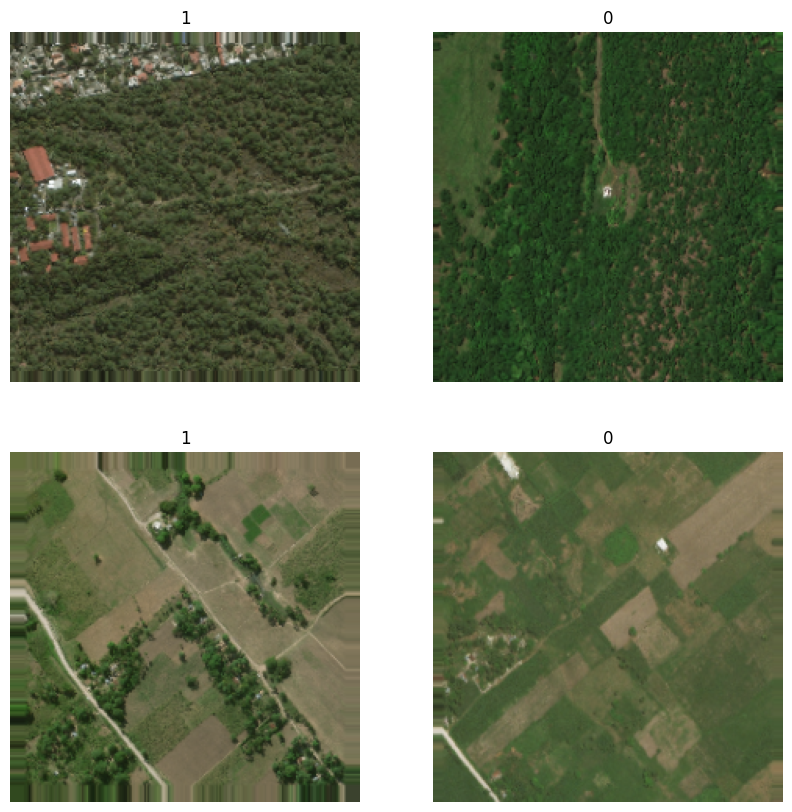

In [32]:
# Visualisasi sample testing
for images, label in pipeline_test.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(4):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i])
        plt.title(int(label[i]))
        plt.axis("off")

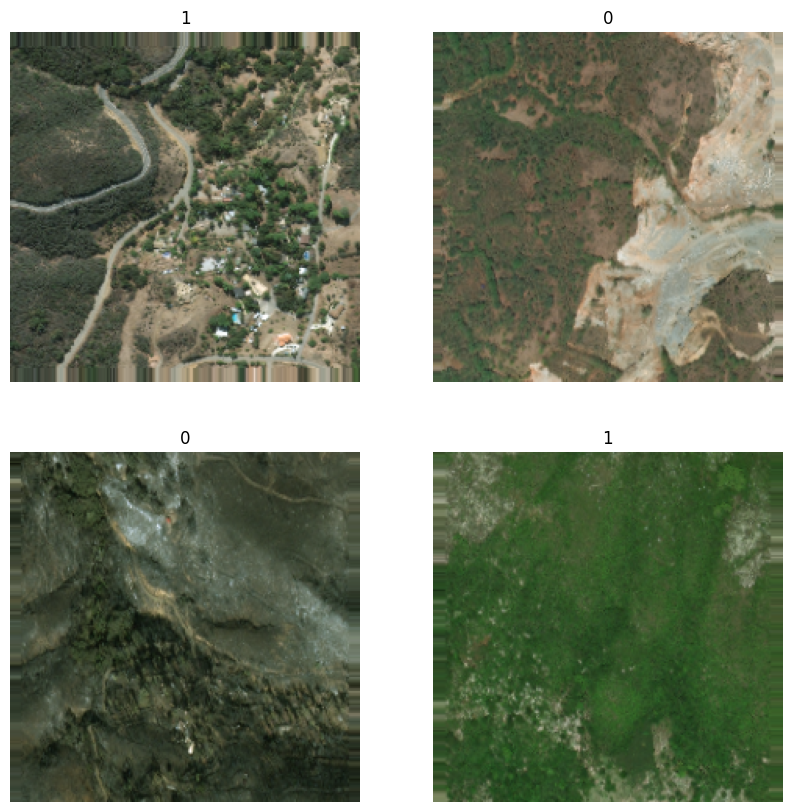

In [33]:
# Visualisasi sample validation
for images, label in pipeline_val.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(4):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i])
        plt.title(int(label[i]))
        plt.axis("off")

# Load pre-trained model

In [34]:
# BIT_MODULES_MR50X1 = "https://www.kaggle.com/models/google/bit/frameworks/TensorFlow2/variations/m-r50x1/versions/1"
# BIT_MODULES_MR50X3 = "https://www.kaggle.com/models/google/bit/frameworks/TensorFlow2/variations/m-r50x3/versions/1"
# BIT_MODULES_MR101X1 = "https://www.kaggle.com/models/google/bit/frameworks/TensorFlow2/variations/m-r101x1/versions/1"
# BIT_MODULES_MR101X3 = "https://www.kaggle.com/models/google/bit/frameworks/TensorFlow2/variations/m-r101x3/versions/1"

# BiT-M version
BIT_MODULES_MR50X1 = "file explorer/BiT-M R50x1"
BIT_MODULES_MR50X3 = "file explorer/BiT-M R50x3"
BIT_MODULES_MR101X1 = "file explorer/BiT-M R101x1"
BIT_MODULES_MR101X3 = "file explorer/BiT-M R101x3"

In [35]:
# VIT_MODULES_S16 = "https://www.kaggle.com/models/spsayakpaul/vision-transformer/frameworks/TensorFlow2/variations/vit-s16-classification/versions/1"

# ViT-S version
VIT_MODULES_S16 = "file explorer/ViT-S16"

# Define callback

In [36]:
def checkpoint(architecture, next=None):
    if next is not None:
        return ModelCheckpoint(
            f"checkpoint/{architecture}.h5",
            monitor="val_binary_accuracy",
            save_best_only=True,
            mode="max"
        )
    
def lr_scheduler():
    return LearningRateScheduler(
        schedule=lambda epoch, lr: lr * tf.math.exp(-0.1) if epoch > 5 else lr,
        verbose=1
    )

def csv_logger(architecture):
    return CSVLogger(
        f"logs/{architecture}.csv"
    )

# Define fine-tune model function

In [37]:
def build_model(ARCHITECTURE: KerasLayer, arc_name: str):
    keras.backend.clear_session()
    
    input = keras.layers.Input(shape=(224, 224, 3))
    
    bit = KerasLayer(ARCHITECTURE, trainable=False)(input)
    bit = keras.layers.Flatten()(bit)
    bit = keras.layers.Dropout(0.4)(bit)
    
    vit = KerasLayer(VIT_MODULES_S16, trainable=False)(input)
    vit = keras.layers.Flatten()(vit)
    vit = keras.layers.Dropout(0.4)(vit)
    
    concat = keras.layers.Concatenate()([bit, vit])
    output = keras.layers.Dense(1, activation="sigmoid")(concat)

    model = Model(inputs=input, outputs=output)
    model.summary()
        
    model.compile(
        optimizer=Adam(
            learning_rate=0.001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7,
        ),
        loss="binary_crossentropy",
        metrics=[
            AUC(name="auc"), 
            "binary_accuracy",
            Precision(name="precision"),
            Recall(name="recall")
        ]
    )
    
    history = model.fit(
        pipeline_train,
        steps_per_epoch=8,
        epochs=20,
        validation_data=pipeline_val,
        validation_steps=8,
        callbacks=[
            lr_scheduler(),
            csv_logger(arc_name),
            checkpoint(arc_name),
        ],
    )

    score = model.evaluate(pipeline_test, verbose=0)
    print("Test loss:", score[0])
    print("Test AUC:", score[1])
    print("Test accuracy:", score[2])
    print("Test precision:", score[3])
    print("Test recall:", score[4])
        
    return model, history, score

# Define plot history function

In [16]:
def apply_f1_history(df):
    df["f1"] = 2 * (df["precision"] * df["recall"]) / (df["precision"] + df["recall"])
    df["val_f1"] = 2 * (df["val_precision"] * df["val_recall"]) / (df["val_precision"] + df["val_recall"])
    return df

In [15]:
def plot_history(df):
    _, ax = plt.subplots(2, 2, figsize=(15, 8))

    metrics_train = ['loss', 'auc', 'binary_accuracy', 'f1']
    metrics_val = ['val_loss', 'val_auc', 'val_binary_accuracy', 'val_f1']

    for i in range(4):
        ax[i//2, i%2].plot(df[metrics_train[i]])
        ax[i//2, i%2].plot(df[metrics_val[i]])
        ax[i//2, i%2].set_title(metrics_train[i])
        ax[i//2, i%2].set_xlabel('epoch')
        ax[i//2, i%2].set_ylabel(metrics_train[i])
        ax[i//2, i%2].legend(['train', 'val'], loc='upper left')
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)

# Define evaluate model function

In [40]:
def classification_image(score):
    if score < 0.5:
        return "Tidak terdeteksi kerusakan"
    else:
        quantile_range = 1 - 0.5
        quantile_interval = quantile_range / 3
        
        if score < 0.5 + quantile_interval:
            return f"Terdeteksi kerusakan ringan sebesar {np.round(score*100, 2)}%"
        elif score < 0.5 + 2 * quantile_interval:
            return f"Terdeteksi kerusakan sedang sebesar {np.round(score*100, 2)}%"
        else:
            return f"Terdeteksi kerusakan berat sebesar {np.round(score*100, 2)}%"

In [42]:
def predict_image(model, img_group):    
    _, ax = plt.subplots(1, 2, figsize=(15, 7)) 
    
    for i, img_path in enumerate(img_group):
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = tf.expand_dims(img_array, 0)
        predictions = model.predict(img_array)
        score = predictions[0]
        ax[i].imshow(img)
        
        hasil = "Terdeteksi kerusakan" if img_path.split("/")[-2] == "post_disaster" else "Tidak terdeteksi kerusakan"
            
        ax[i].set_title(f'Actual: {hasil} \n Predicted: {classification_image(1 - score)}')
        ax[i].axis("off")

# Trainining model

## MR50X1

In [ ]:
bit_mr50x1, history_mr50x1, score_mr50x1 = build_model(BIT_MODULES_MR50X1, "bit_mr50x1")

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 keras_layer (KerasLayer)       (None, 2048)         23500352    ['input_1[0][0]']                
                                                                                                  
 keras_layer_1 (KerasLayer)     (None, 1000)         22050664    ['input_1[0][0]']                
                                                                                                  
 flatten (Flatten)              (None, 2048)         0           ['keras_layer[0][0]']        

In [ ]:
bit_mr50x1.save("model/bit_mr50x1")

INFO:tensorflow:Assets written to: model/bit_mr50x1\assets


In [42]:
model = keras.models.load_model(
    filepath="model/bit_mr50x1", 
    custom_objects={
        "KerasLayer": KerasLayer, 
    }
)

1/1 [==============================] - 1s 505ms/step


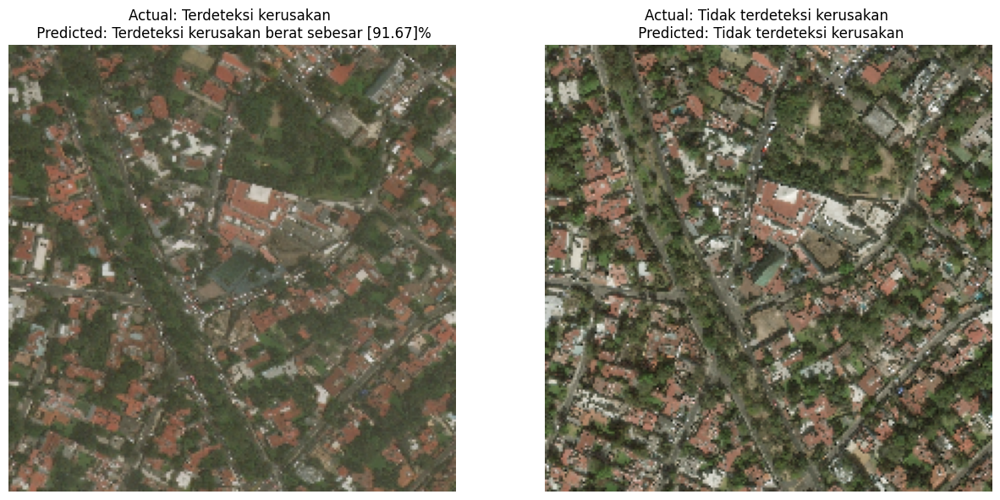

In [45]:
img_path1 = "val/preprocessed/post_disaster/mexico-earthquake_00000014_post_disaster.png"
img_path2 = "val/preprocessed/pre_disaster/mexico-earthquake_00000014_pre_disaster.png"

img_group = [img_path1, img_path2]

predict_image(model, img_group)

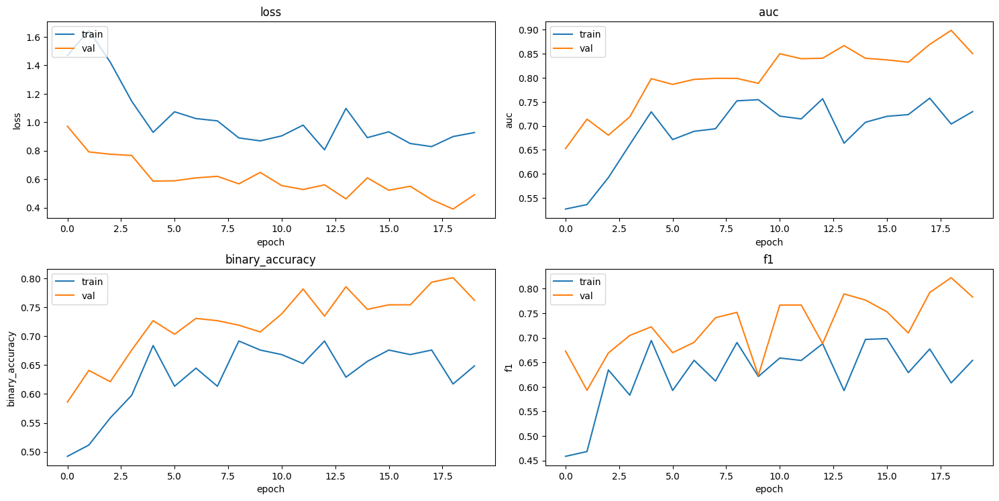

In [17]:
df_mr50x1 = apply_f1_history(pd.read_csv("logs/bit_mr50x1.csv"))
plot_history(df_mr50x1)

## MR50X3

In [ ]:
bit_mr50x3, history_mr50x3, score_mr50x3 = build_model(BIT_MODULES_MR50X3, "bit_mr50x3")

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 keras_layer (KerasLayer)       (None, 6144)         211174080   ['input_1[0][0]']                
                                                                                                  
 keras_layer_1 (KerasLayer)     (None, 1000)         22050664    ['input_1[0][0]']                
                                                                                                  
 flatten (Flatten)              (None, 6144)         0           ['keras_layer[0][0]']        

In [ ]:
bit_mr50x3.save("model/bit_mr50x3")

INFO:tensorflow:Assets written to: model/bit_mr50x3\assets


In [46]:
model = keras.models.load_model(
    filepath="model/bit_mr50x3", 
    custom_objects={
        "KerasLayer": KerasLayer, 
    }
)

1/1 [==============================] - 3s 3s/step


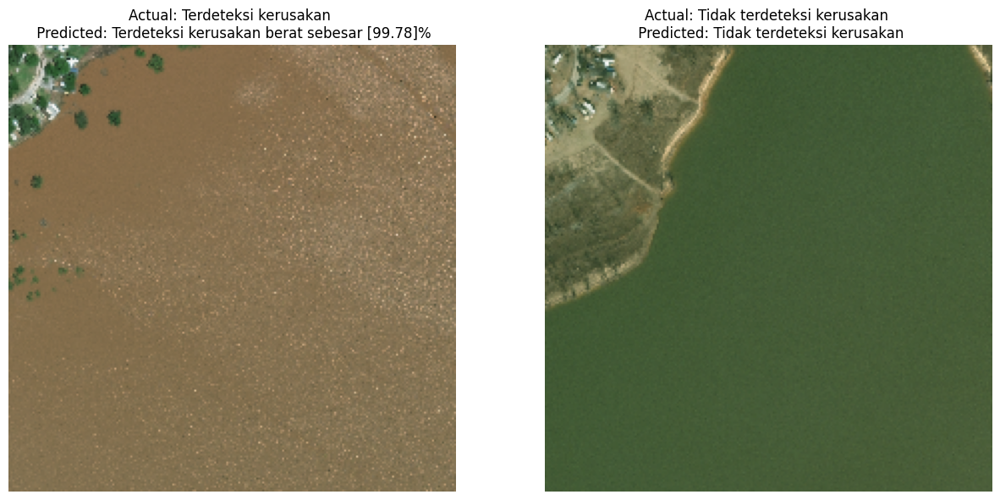

In [47]:
img_path1 = "val/preprocessed/post_disaster/midwest-flooding_00000291_post_disaster.png"
img_path2 = "val/preprocessed/pre_disaster/midwest-flooding_00000291_pre_disaster.png"

img_group = [img_path1, img_path2]

predict_image(model, img_group)

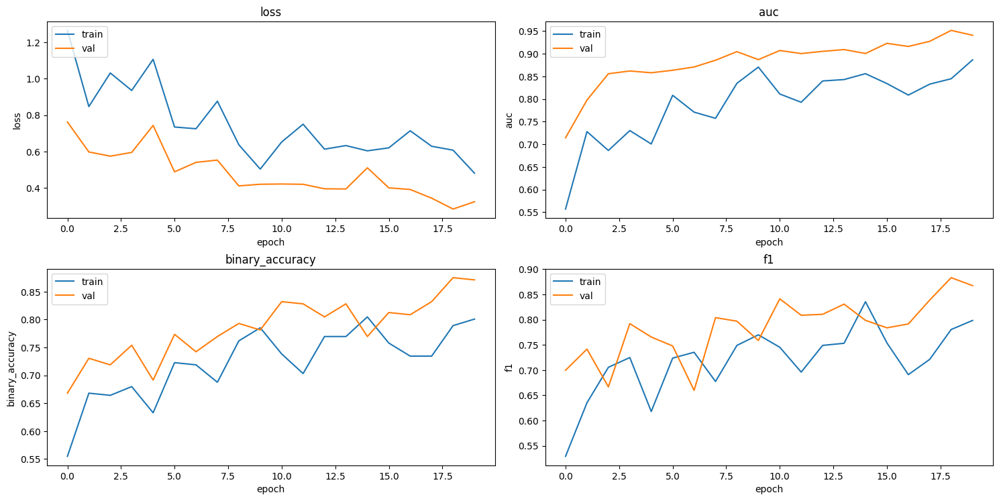

In [ ]:
df_mr50x3 = apply_f1_history(pd.read_csv("logs/bit_mr50x3.csv"))
plot_history(df_mr50x3)

## MR101X1

In [ ]:
bit_mr101x1, history_mr101x1, score_mr101x1 = build_model(BIT_MODULES_MR101X1, "bit_mr101x1")

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 keras_layer (KerasLayer)       (None, 2048)         42492480    ['input_1[0][0]']                
                                                                                                  
 keras_layer_1 (KerasLayer)     (None, 1000)         22050664    ['input_1[0][0]']                
                                                                                                  
 flatten (Flatten)              (None, 2048)         0           ['keras_layer[0][0]']        

In [ ]:
bit_mr101x1.save("model/bit_mr101x1")

INFO:tensorflow:Assets written to: model/bit_mr101x1\assets


In [48]:
model = keras.models.load_model(
    filepath="model/bit_mr101x1", 
    custom_objects={
        "KerasLayer": KerasLayer, 
    }
)

1/1 [==============================] - 7s 7s/step


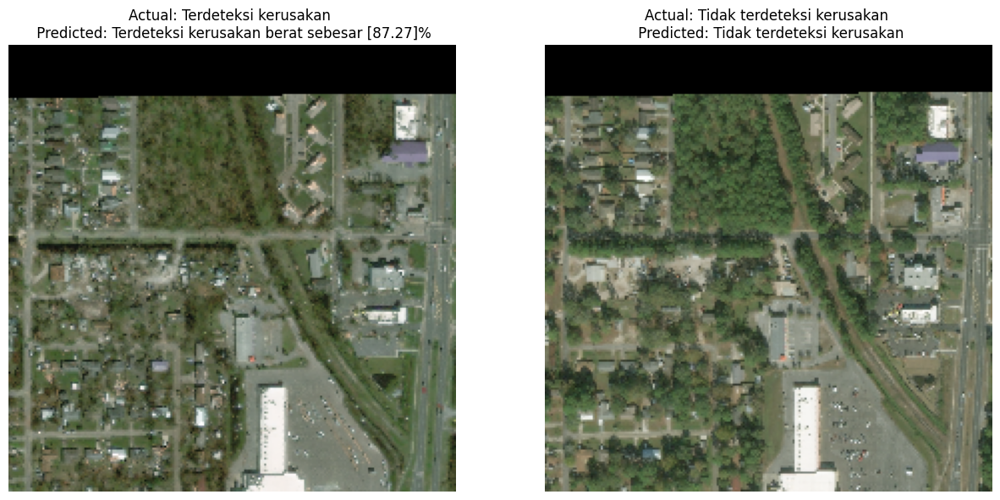

In [49]:
img_path1 = "val/preprocessed/post_disaster/hurricane-michael_00000064_post_disaster.png"
img_path2 = "val/preprocessed/pre_disaster/hurricane-michael_00000064_pre_disaster.png"

img_group = [img_path1, img_path2]

predict_image(model, img_group)

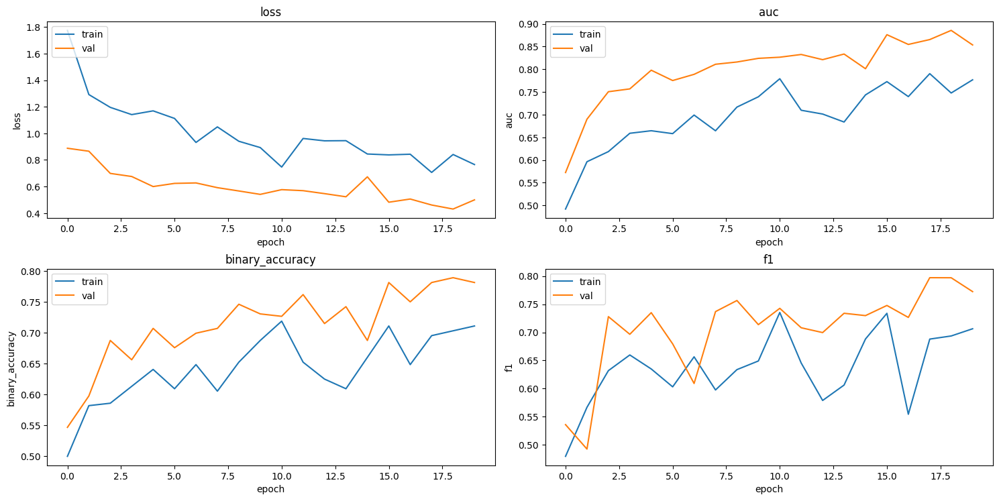

In [ ]:
df_mr101x1 = apply_f1_history(pd.read_csv("logs/bit_mr101x1.csv"))
plot_history(df_mr101x1)

## MR101X3

In [ ]:
bit_mr101x3, history_mr101x3, score_mr101x3 = build_model(BIT_MODULES_MR101X3, "bit_mr101x3")

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 keras_layer (KerasLayer)       (None, 6144)         381789888   ['input_1[0][0]']                
                                                                                                  
 keras_layer_1 (KerasLayer)     (None, 1000)         22050664    ['input_1[0][0]']                
                                                                                                  
 flatten (Flatten)              (None, 6144)         0           ['keras_layer[0][0]']        

In [ ]:
bit_mr101x3.save("model/bit_mr101x3")

INFO:tensorflow:Assets written to: model/bit_mr101x3\assets


In [50]:
model = keras.models.load_model(
    filepath="model/bit_mr101x3", 
    custom_objects={
        "KerasLayer": KerasLayer, 
    }
)

1/1 [==============================] - 49s 49s/step


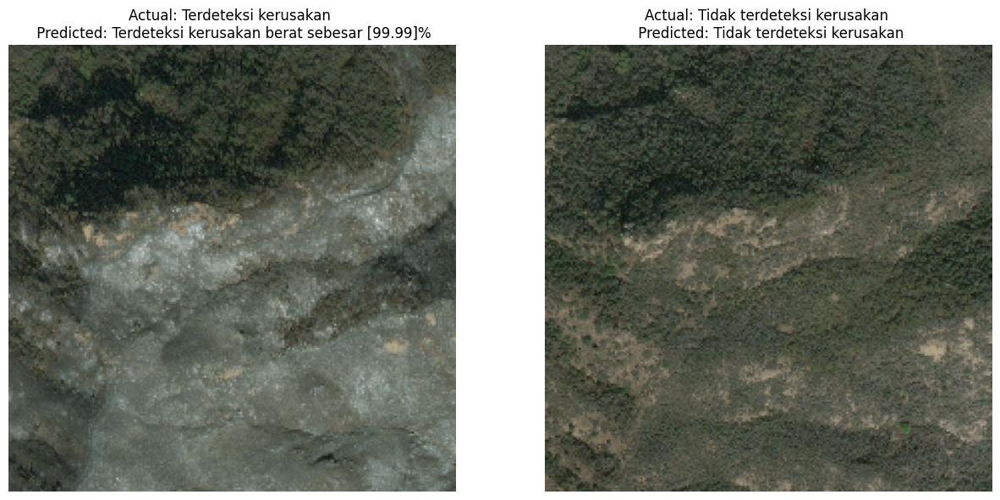

In [51]:
img_path1 = "val/preprocessed/post_disaster/socal-fire_00000017_post_disaster.png"
img_path2 = "val/preprocessed/pre_disaster/socal-fire_00000017_pre_disaster.png"

img_group = [img_path1, img_path2]

predict_image(model, img_group)

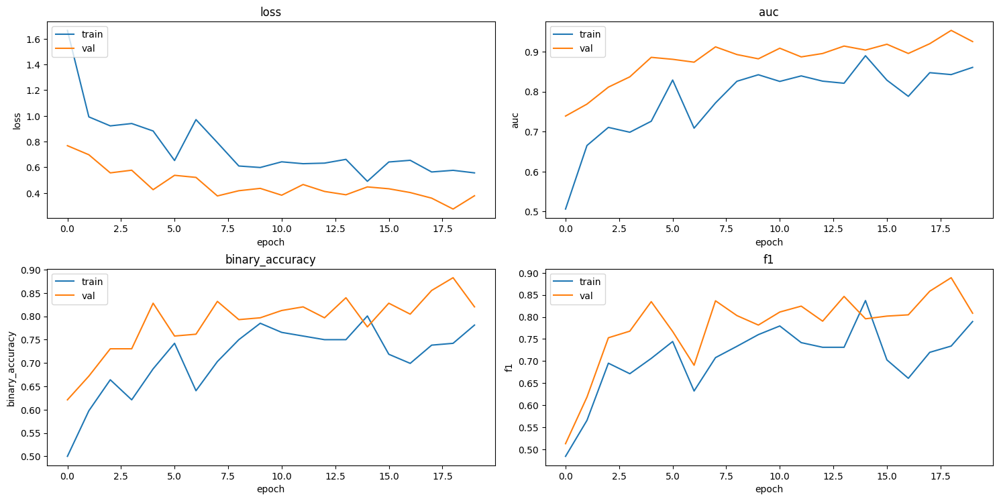

In [ ]:
df_mr101x3 = apply_f1_history(pd.read_csv("logs/bit_mr101x3.csv"))
plot_history(df_mr101x3)

# Summary

## Displays failure and success data

In [54]:
def predict_several_image(model, img_group, nrows=3):    
    _, ax = plt.subplots(nrows=nrows, ncols=5, figsize=(20, (10*nrows)/3)) 
    
    for i, img_path in enumerate(img_group):
        row = i // 5
        col = i % 5
        
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = tf.expand_dims(img_array, 0)
        predictions = model.predict(img_array)
        score = predictions[0]
        ax[row, col].imshow(img)  
        
        hasil = "Terdeteksi kerusakan" if img_path.split("/")[-2] == "post_disaster" else "Tidak terdeteksi kerusakan"
        label = "Tidak terdeteksi kerusakan" if 1 - score < 0.5 else "Terdeteksi kerusakan"
            
        ax[row, col].set_title(f'Actual: {hasil} \n Predicted: {label}', color="red" if hasil != label else "black")
        ax[row, col].axis("off")

In [43]:
model = keras.models.load_model(
    filepath="model/bit_mr101x3", 
    custom_objects={
        "KerasLayer": KerasLayer, 
    }
)

In [44]:
df_img = pd.read_csv("val/val.csv")

df_post_disaster    = df_img[df_img['label'] == "post_disaster"]
df_pre_disaster     = df_img[df_img['label'] == "pre_disaster"]

POST_DISASTER_PATH  = "val/preprocessed/post_disaster"
PRE_DISASTER_PATH   = "val/preprocessed/pre_disaster"

1/1 [==============================] - 5s 5s/step


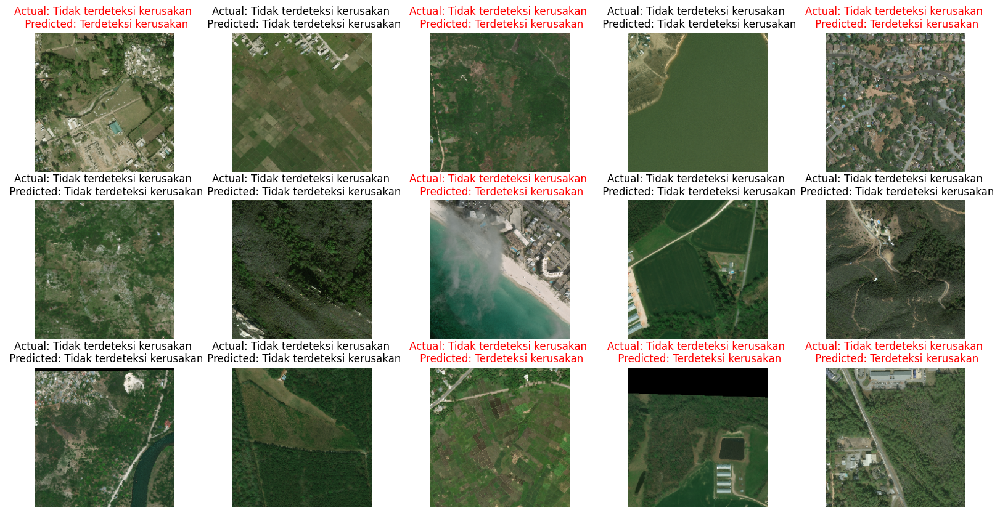

In [49]:
pre_disaster_images = [f"{PRE_DISASTER_PATH}/{img}" for img in df_pre_disaster["image"].sample(15).values]
predict_several_image(model, pre_disaster_images)

1/1 [==============================] - 4s 4s/step


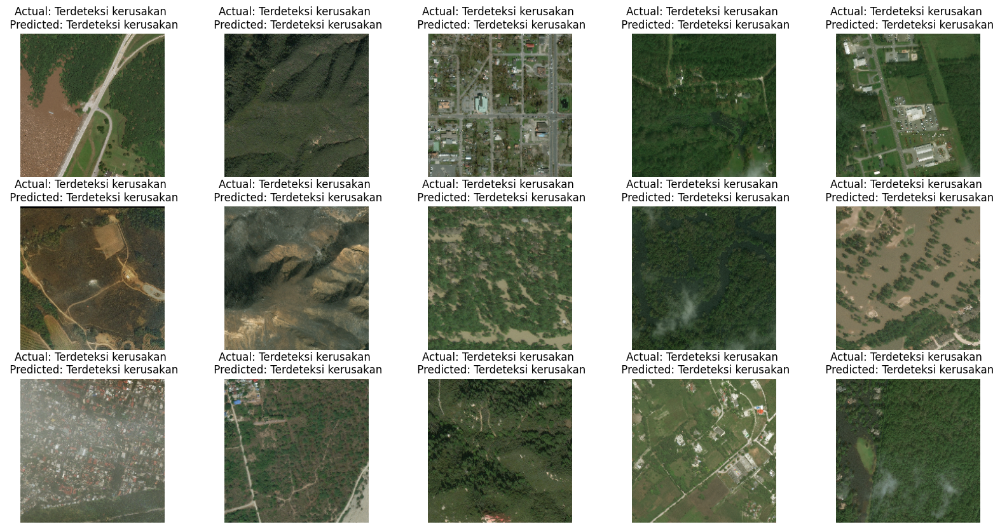

In [55]:
post_disaster_images = [f"{POST_DISASTER_PATH}/{img}" for img in df_post_disaster["image"].sample(15).values]
predict_several_image(model, post_disaster_images)

In [ ]:
predict_several_image(model, pre_disaster_images + post_disaster_images, nrows=6)

## Evaluate models

In [ ]:
def evaluate(model_path: str):
    model = keras.models.load_model(
        filepath=model_path, 
        custom_objects={
            "KerasLayer": KerasLayer
        }
    )
    
    score = model.evaluate(test_generator, verbose=0)
    
    print("Test loss:", score[0])
    print("Test AUC:", score[1])
    print("Test accuracy:", score[2])
    print("Test precision:", score[3])
    print("Test recall:", score[4])
    
    return score

In [ ]:
bit_mr50x1_score    = evaluate("model/bit_mr50x1")

In [ ]:
bit_mr50x3_score    = evaluate("model/bit_mr50x3")

In [ ]:
bit_mr101x1_score   = evaluate("model/bit_mr101x1")

In [ ]:
bit_mr101x3_score   = evaluate("model/bit_mr101x3")

## Convert to csv

In [ ]:
df = pd.DataFrame({
    "Pretrained Model": [
        "BiT MR50 X1", 
        "BiT MR50 X3", 
        "BiT MR101 X1", 
        "BiT MR101 X3"
    ],
    "Test Loss": [
        bit_mr50x1_score[0], 
        bit_mr50x3_score[0], 
        bit_mr101x1_score[0], 
        bit_mr101x3_score[0]
    ],
    "Test AUC": [
        bit_mr50x1_score[1], 
        bit_mr50x3_score[1], 
        bit_mr101x1_score[1], 
        bit_mr101x3_score[1]
    ],
    "Test Accuracy": [
        bit_mr50x1_score[2], 
        bit_mr50x3_score[2], 
        bit_mr101x1_score[2], 
        bit_mr101x3_score[2]
    ],
    "Test Precission": [
        bit_mr50x1_score[3], 
        bit_mr50x3_score[3], 
        bit_mr101x1_score[3], 
        bit_mr101x3_score[3]
    ],
    "Test Recall": [
        bit_mr50x1_score[4], 
        bit_mr50x3_score[4], 
        bit_mr101x1_score[4], 
        bit_mr101x3_score[4]
    ]
})

In [ ]:
def apply_f1score(precision, recall):
    return 2 * (precision * recall) / (precision + recall)

df["Test F1 Score"] = apply_f1score(df["Test Precission"], df["Test Recall"])
df.to_csv("evaluation.csv", index=False)

df[['Pretrained Model', 'Test Loss', 'Test AUC', 'Test Accuracy', 'Test F1 Score']]

## Display all of evaluation metrics

In [8]:
def apply_f1(df):
    df["f1"] = 2 * (df["precision"] * df["recall"]) / (df["precision"] + df["recall"])
    df["val_f1"] = 2 * (df["val_precision"] * df["val_recall"]) / (df["val_precision"] + df["val_recall"])
    return df

logs_mr50x1 = apply_f1(pd.read_csv("logs/bit_mr50x1.csv"))
logs_mr50x3 = apply_f1(pd.read_csv("logs/bit_mr50x3.csv"))
logs_mr101x1 = apply_f1(pd.read_csv("logs/bit_mr101x1.csv"))
logs_mr101x3 = apply_f1(pd.read_csv("logs/bit_mr101x3.csv"))

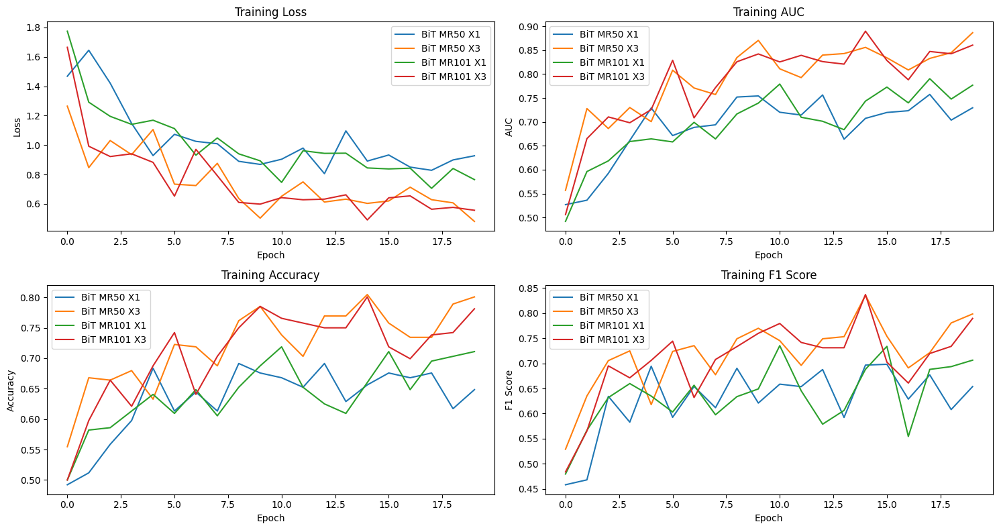

In [18]:
labels = ["BiT MR50 X1", "BiT MR50 X3", "BiT MR101 X1", "BiT MR101 X3"]
metrics = ["loss", "auc", "binary_accuracy", "f1"]
titles = ["Training Loss", "Training AUC", "Training Accuracy", "Training F1 Score"]
ylabels = ["Loss", "AUC", "Accuracy", "F1 Score"]

fig, ax = plt.subplots(2, 2, figsize=(15, 8))

for i, metric in enumerate(metrics):
    for logs, label in zip([logs_mr50x1, logs_mr50x3, logs_mr101x1, logs_mr101x3], labels):
        ax[i//2, i%2].plot(logs[metric], label=label)
    ax[i//2, i%2].set_title(titles[i])
    ax[i//2, i%2].set_xlabel("Epoch")
    ax[i//2, i%2].set_ylabel(ylabels[i])
    ax[i//2, i%2].legend()

plt.tight_layout()
plt.show()

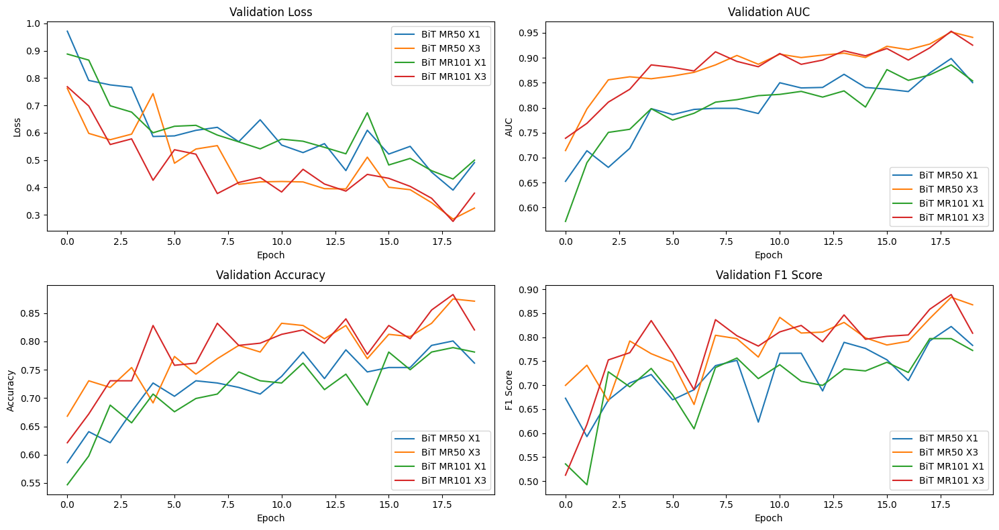

In [19]:
labels = ["BiT MR50 X1", "BiT MR50 X3", "BiT MR101 X1", "BiT MR101 X3"]
metrics = ["val_loss", "val_auc", "val_binary_accuracy", "val_f1"]
titles = ["Validation Loss", "Validation AUC", "Validation Accuracy", "Validation F1 Score"]
ylabels = ["Loss", "AUC", "Accuracy", "F1 Score"]

fig, ax = plt.subplots(2, 2, figsize=(15, 8))

for i, metric in enumerate(metrics):
    for logs, label in zip([logs_mr50x1, logs_mr50x3, logs_mr101x1, logs_mr101x3], labels):
        ax[i//2, i%2].plot(logs[metric], label=label)
    ax[i//2, i%2].set_title(titles[i])
    ax[i//2, i%2].set_xlabel("Epoch")
    ax[i//2, i%2].set_ylabel(ylabels[i])
    ax[i//2, i%2].legend()
    
plt.tight_layout()
plt.show()